In [1]:
!nvidia-smi

Fri Jan 30 10:06:04 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   39C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [4]:
!pip install ultralytics

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics 8.4.9 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 39.1/112.6 GB disk)


In [2]:
!unzip -q /content/data.zip -d /content/custom_data

In [5]:
!python train_val_split.py --datapath="/content/custom_data" --train_pct=0.85

Created folder at /content/data/train/images.
Created folder at /content/data/train/labels.
Created folder at /content/data/validation/images.
Created folder at /content/data/validation/labels.
Number of image files: 132
Number of annotation files: 132
Images moving to train: 112
Images moving to validation: 20


In [6]:
import yaml
import os

def create_data_yaml(path_to_classes_txt, path_to_data_yaml):

  # Read class.txt to get class names
  if not os.path.exists(path_to_classes_txt):
    print(f'classes.txt file not found! Please create a classes.txt labelmap and move it to {path_to_classes_txt}')
    return
  with open(path_to_classes_txt, 'r') as f:
    classes = []
    for line in f.readlines():
      if len(line.strip()) == 0: continue
      classes.append(line.strip())
  number_of_classes = len(classes)

  # Create data dictionary
  data = {
      'path': '/content/data',
      'train': 'train/images',
      'val': 'validation/images',
      'nc': number_of_classes,
      'names': classes
  }

  # Write data to YAML file
  with open(path_to_data_yaml, 'w') as f:
    yaml.dump(data, f, sort_keys=False)
  print(f'Created config file at {path_to_data_yaml}')

  return

# Define path to classes.txt and run function
path_to_classes_txt = '/content/custom_data/classes.txt'
path_to_data_yaml = '/content/data.yaml'

create_data_yaml(path_to_classes_txt, path_to_data_yaml)

print('\nFile contents:\n')
!cat /content/data.yaml

Created config file at /content/data.yaml

File contents:

path: /content/data
train: train/images
val: validation/images
nc: 12
names:
- Auto Rickshaw
- Bus
- CNG
- Cycle Rickshaw
- Microbus
- Minibus
- Motorcycle
- Private Sedan Car
- SUV
- Tempo
- Trailer
- Truck


In [8]:
!yolo detect train data=/content/data.yaml model=yolo26m.pt epochs=60 imgsz=640

Ultralytics 8.4.9 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26m.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=

In [9]:
!yolo detect predict model=runs/detect/train2/weights/best.pt source=data/validation/images save=True

Ultralytics 8.4.9 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO26m summary (fused): 132 layers, 20,358,704 parameters, 0 gradients, 67.9 GFLOPs

image 1/20 /content/data/validation/images/0458ec6f-119.jpg: 416x640 1 Bus, 2 Microbuss, 1 Private Sedan Car, 64.8ms
image 2/20 /content/data/validation/images/04b9aad1-175.jpg: 416x640 4 Buss, 6 Trucks, 29.4ms
image 3/20 /content/data/validation/images/1157b5e7-75.jpg: 416x640 3 Buss, 1 Microbus, 2 Motorcycles, 2 Private Sedan Cars, 1 Truck, 29.3ms
image 4/20 /content/data/validation/images/136604a6-408.jpg: 416x640 1 Auto Rickshaw, 1 Bus, 2 CNGs, 3 Cycle Rickshaws, 3 Motorcycles, 2 Private Sedan Cars, 1 SUV, 4 Trucks, 29.3ms
image 5/20 /content/data/validation/images/14133d4d-84.jpg: 416x640 1 CNG, 3 Motorcycles, 3 SUVs, 29.3ms
image 6/20 /content/data/validation/images/24deb7e7-361.jpg: 416x640 1 Auto Rickshaw, 4 Trucks, 29.3ms
image 7/20 /content/data/validation/images/2c0e425c-426.jpg: 416x640 1 Bus, 8 Motorcycles, 1

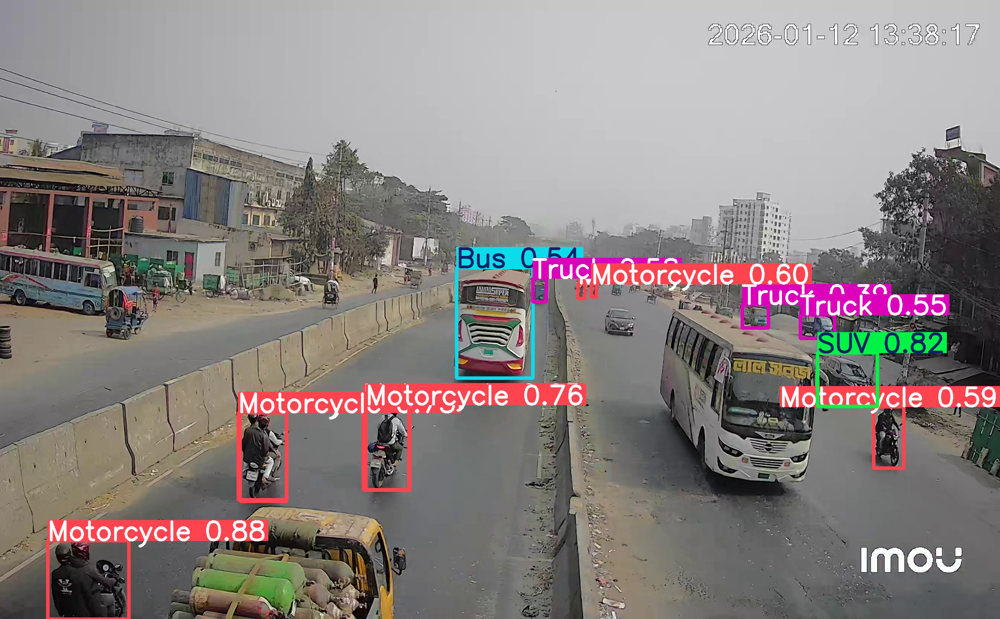

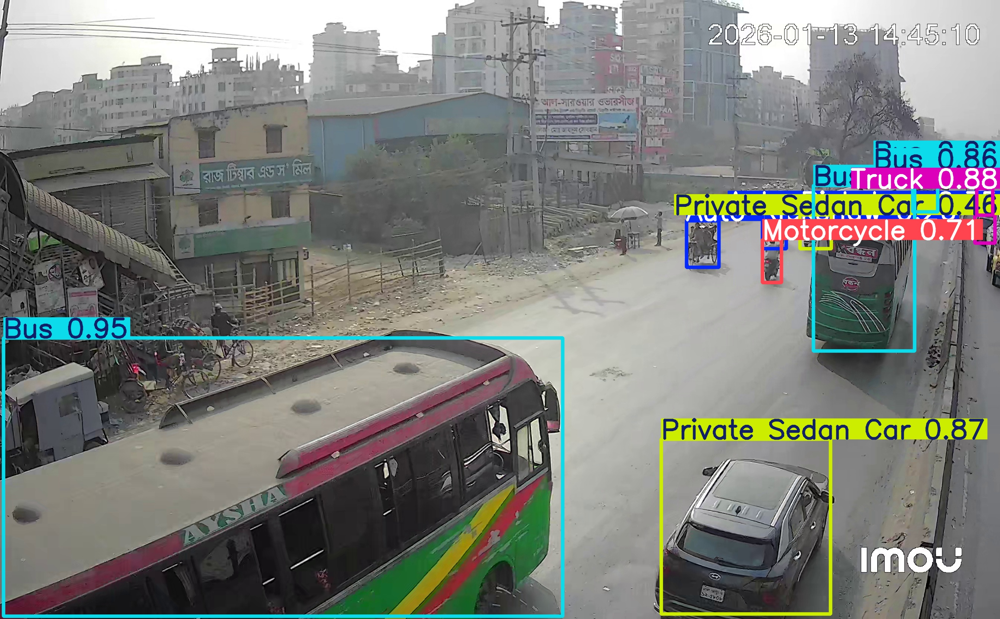

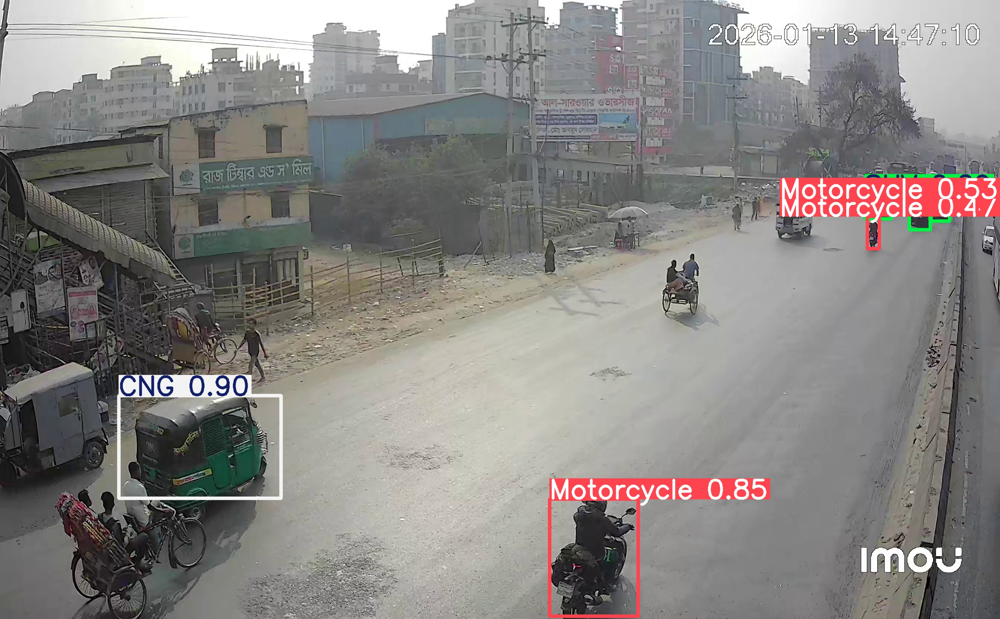

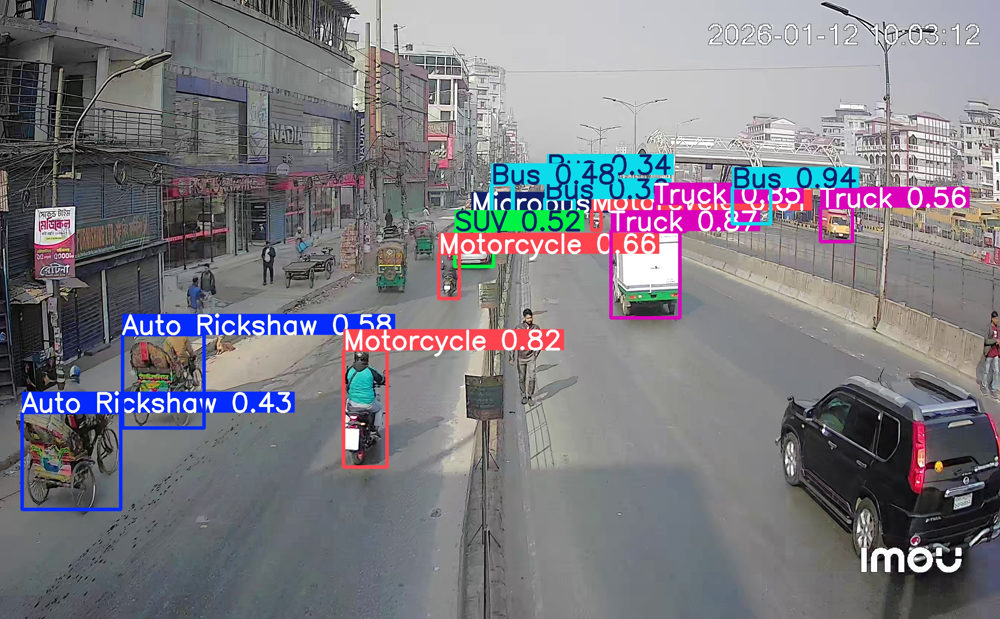

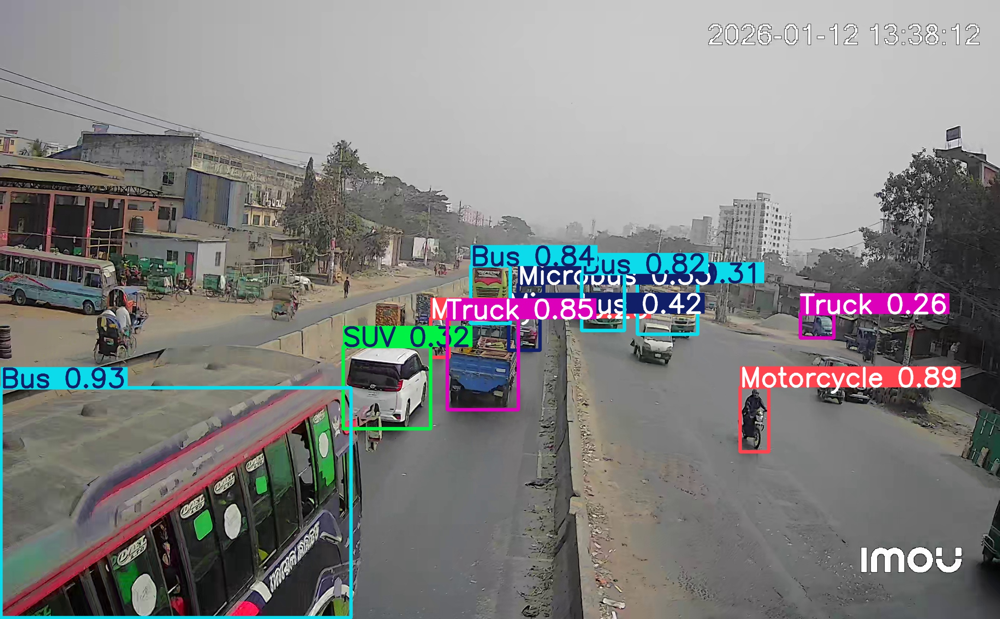

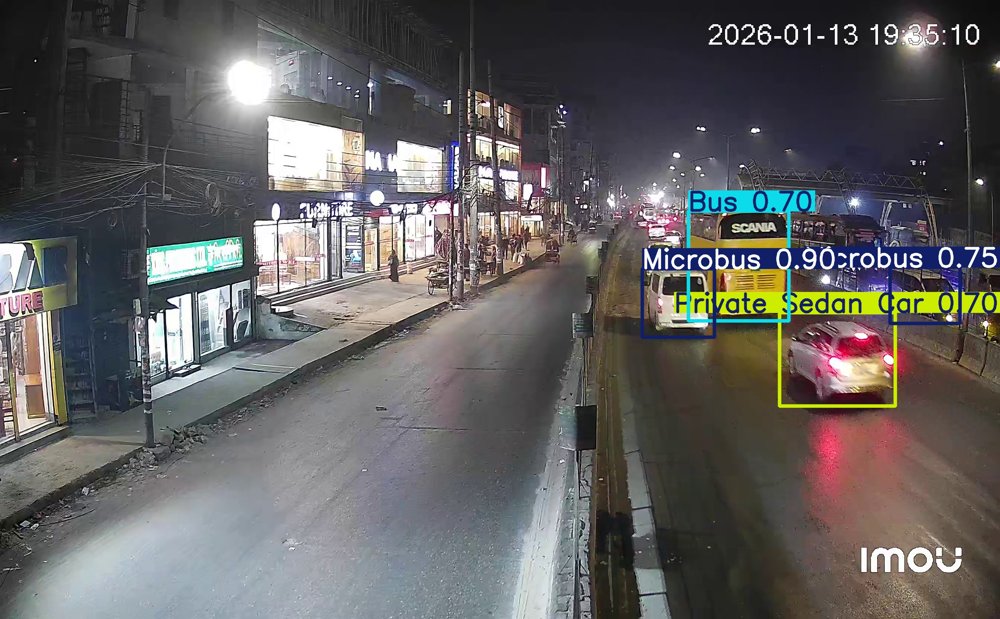

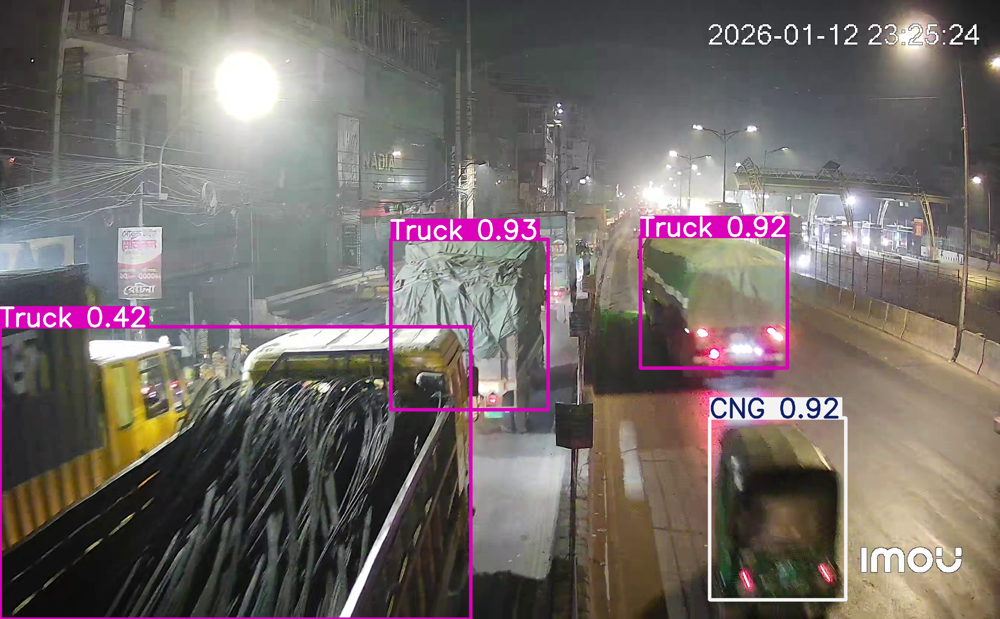

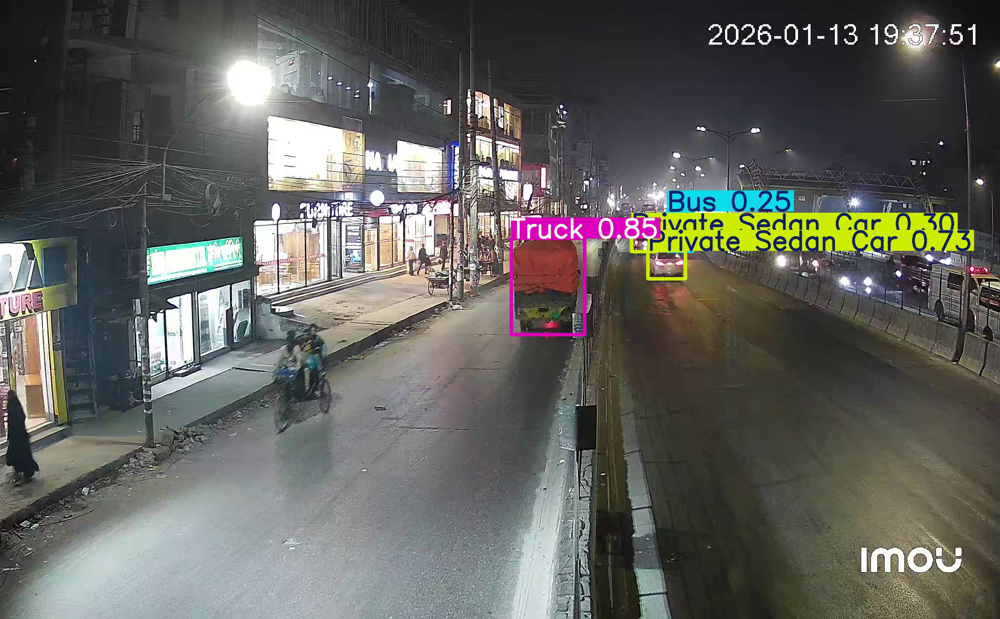

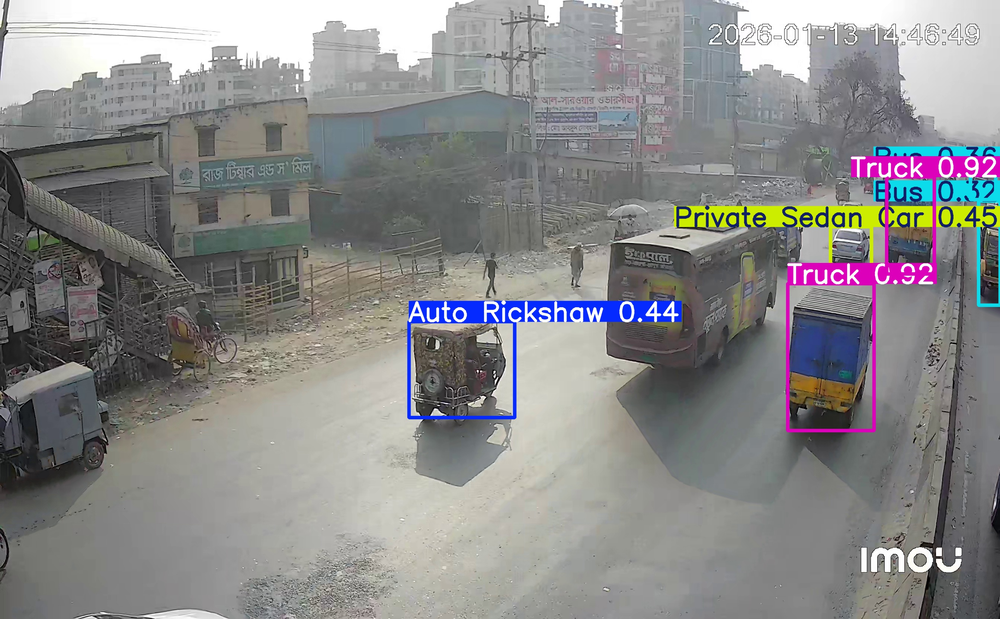

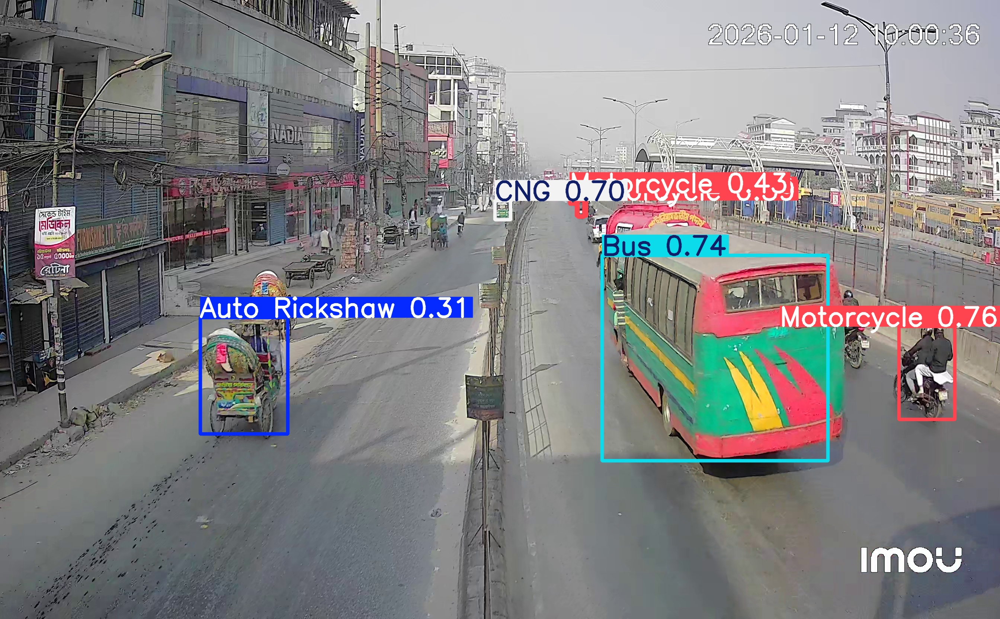

In [10]:
import glob
from IPython.display import Image, display
for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg')[:10]:
  display(Image(filename=image_path, height=400))
  print('\n')

In [11]:
!mkdir /content/my_model
!cp /content/runs/detect/train2/weights/best.pt /content/my_model/my_model.pt
!cp -r /content/runs/detect/train2 /content/my_model

%cd my_model
!zip /content/my_model.zip my_model.pt
!zip -r /content/my_model.zip train2
%cd /content

/content/my_model
  adding: my_model.pt (deflated 8%)
  adding: train2/ (stored 0%)
  adding: train2/train_batch2.jpg (deflated 3%)
  adding: train2/BoxR_curve.png (deflated 7%)
  adding: train2/results.png (deflated 6%)
  adding: train2/labels.jpg (deflated 31%)
  adding: train2/val_batch0_labels.jpg (deflated 4%)
  adding: train2/weights/ (stored 0%)
  adding: train2/weights/last.pt (deflated 8%)
  adding: train2/weights/best.pt (deflated 8%)
  adding: train2/confusion_matrix.png (deflated 20%)
  adding: train2/BoxPR_curve.png (deflated 11%)
  adding: train2/BoxF1_curve.png (deflated 5%)
  adding: train2/confusion_matrix_normalized.png (deflated 15%)
  adding: train2/train_batch1.jpg (deflated 4%)
  adding: train2/train_batch351.jpg (deflated 13%)
  adding: train2/results.csv (deflated 62%)
  adding: train2/val_batch0_pred.jpg (deflated 4%)
  adding: train2/args.yaml (deflated 53%)
  adding: train2/train_batch0.jpg (deflated 4%)
  adding: train2/train_batch352.jpg (deflated 11%)
  ad

In [12]:
!yolo detect predict model=runs/detect/train2/weights/best.pt source='/content/Inference-1.mp4' save=True

Streaming output truncated to the last 5000 lines.
video 1/1 (frame 2507/7503) /content/Inference-1.mp4: 416x640 2 Buss, 2 Motorcycles, 8 Private Sedan Cars, 29.4ms
video 1/1 (frame 2508/7503) /content/Inference-1.mp4: 416x640 2 Buss, 2 Motorcycles, 8 Private Sedan Cars, 29.3ms
video 1/1 (frame 2509/7503) /content/Inference-1.mp4: 416x640 2 Buss, 1 CNG, 2 Motorcycles, 9 Private Sedan Cars, 29.4ms
video 1/1 (frame 2510/7503) /content/Inference-1.mp4: 416x640 1 Bus, 2 CNGs, 1 Microbus, 1 Motorcycle, 4 Private Sedan Cars, 1 SUV, 29.4ms
video 1/1 (frame 2511/7503) /content/Inference-1.mp4: 416x640 1 Bus, 2 CNGs, 1 Microbus, 1 Motorcycle, 5 Private Sedan Cars, 1 SUV, 29.4ms
video 1/1 (frame 2512/7503) /content/Inference-1.mp4: 416x640 1 Bus, 1 CNG, 1 Microbus, 1 Motorcycle, 6 Private Sedan Cars, 1 SUV, 29.4ms
video 1/1 (frame 2513/7503) /content/Inference-1.mp4: 416x640 1 Bus, 1 CNG, 1 Microbus, 1 Motorcycle, 6 Private Sedan Cars, 1 SUV, 29.3ms
video 1/1 (frame 2514/7503) /content/Inference

In [13]:
!yolo detect predict model=runs/detect/train2/weights/best.pt source='/content/Inference-2.mp4' save=True line_width=1

Streaming output truncated to the last 5000 lines.
video 1/1 (frame 2505/7501) /content/Inference-2.mp4: 416x640 1 Bus, 2 CNGs, 2 Microbuss, 5 Private Sedan Cars, 2 Trucks, 28.8ms
video 1/1 (frame 2506/7501) /content/Inference-2.mp4: 416x640 1 Bus, 2 CNGs, 2 Microbuss, 1 Motorcycle, 5 Private Sedan Cars, 1 Truck, 28.8ms
video 1/1 (frame 2507/7501) /content/Inference-2.mp4: 416x640 1 Bus, 2 CNGs, 1 Microbus, 1 Motorcycle, 5 Private Sedan Cars, 1 Truck, 28.7ms
video 1/1 (frame 2508/7501) /content/Inference-2.mp4: 416x640 1 Bus, 2 CNGs, 1 Microbus, 6 Private Sedan Cars, 1 Truck, 28.9ms
video 1/1 (frame 2509/7501) /content/Inference-2.mp4: 416x640 1 Bus, 1 CNG, 6 Private Sedan Cars, 1 Truck, 28.7ms
video 1/1 (frame 2510/7501) /content/Inference-2.mp4: 416x640 1 Bus, 1 CNG, 1 Microbus, 7 Private Sedan Cars, 1 SUV, 1 Truck, 28.8ms
video 1/1 (frame 2511/7501) /content/Inference-2.mp4: 416x640 1 Bus, 7 Private Sedan Cars, 1 Truck, 28.8ms
video 1/1 (frame 2512/7501) /content/Inference-2.mp4: 41

In [14]:
!zip -r runs.zip /content/runs

  adding: content/runs/ (stored 0%)
  adding: content/runs/detect/ (stored 0%)
  adding: content/runs/detect/predict/ (stored 0%)
  adding: content/runs/detect/predict/2c0e425c-426.jpg (deflated 2%)
  adding: content/runs/detect/predict/2f9a6c8f-61.jpg (deflated 1%)
  adding: content/runs/detect/predict/14133d4d-84.jpg (deflated 0%)
  adding: content/runs/detect/predict/44466aca-38.jpg (deflated 1%)
  adding: content/runs/detect/predict/658c9edf-425.jpg (deflated 2%)
  adding: content/runs/detect/predict/0458ec6f-119.jpg (deflated 0%)
  adding: content/runs/detect/predict/d0c7a134-219.jpg (deflated 0%)
  adding: content/runs/detect/predict/f3d20220-150.jpg (deflated 0%)
  adding: content/runs/detect/predict/6e6fc8bf-80.jpg (deflated 1%)
  adding: content/runs/detect/predict/40b9b688-8.jpg (deflated 1%)
  adding: content/runs/detect/predict/608f8892-414.jpg (deflated 2%)
  adding: content/runs/detect/predict/136604a6-408.jpg (deflated 2%)
  adding: content/runs/detect/predict/1157b5e7-7